# Assignment 5

## Q1. Classification Model (40 points)

Best Model accuracy: 96.74%  

|Ground Truth Class|Predicted Class|Visualization|Interpretation|
|:-:|:-:|:-:|:-:|
|Chair|Chair|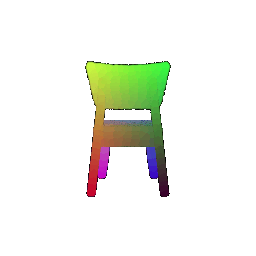|Correctly classified as chair|
|Vase|Vase|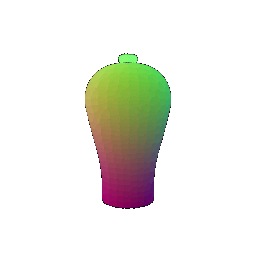|Correctly classified as vase|
|Lamp|Lamp|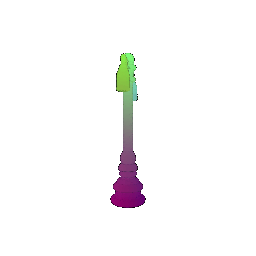|Correctly classified as lamp|
|Chair|Lamp|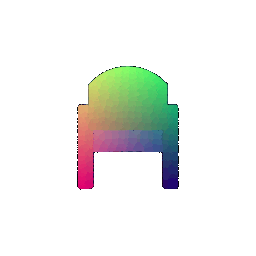|Wrongly classified as lamp. The reason might be the closed configuration of the chair|
|Vase|Lamp|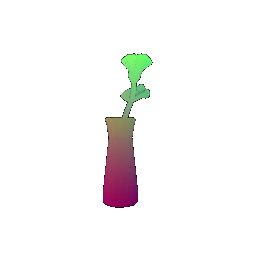|Wrongly classified as lamp. The slender shape of the vase with a single slender flower in it might have confused the model to predict it as a lamp.|
|Lamp|Vase|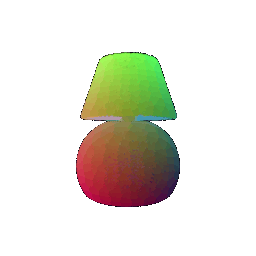|Lamp wrongly classified as a vase. The reason seems to be a huge round base of the lamp, that kind of looks like a flower pot.|

## Q2. Segmentation Model (40 points)

Best Model accuracy: 89.78%

|Ground Truth Segmentation|Predicted Segmentation|Accuracy (%)|Interpretation|
|:-:|:-:|:-:|:-:|
|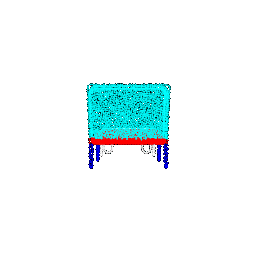|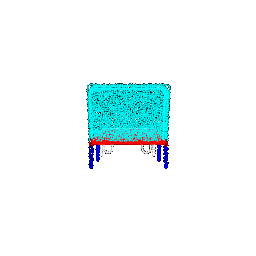|99.0|Near perfect segmentation|
|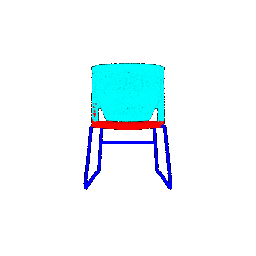|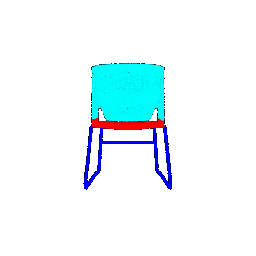|99.0|Near perfect segmentation|
|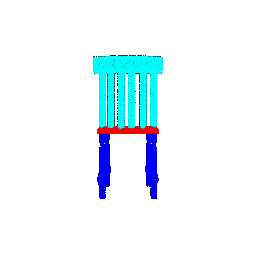|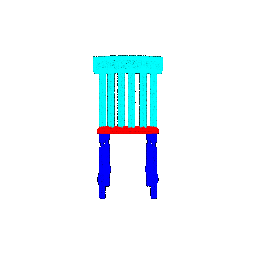|99.2|Near perfect segmentation|
|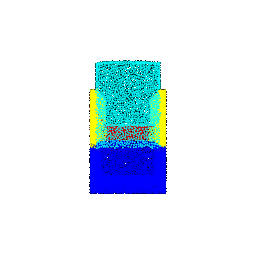|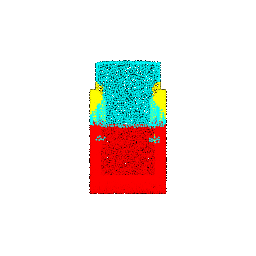|45.3|Failure case: Seat has been combined with the base of the chair. It might be because point coordinates have almost same z dimension that might have caused the blending|
|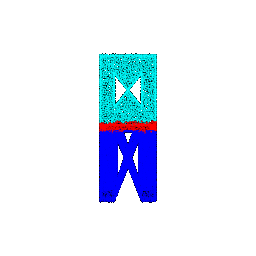|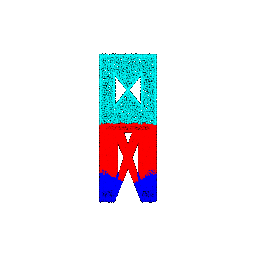|46.5|Failure case: Seat has been combined with the base of the chair. It might be because point coordinates have almost same z dimension that might have caused the blending|

## Q3. Robustness Analysis (20 points)

### Ablation: Point cloud rotation
Rotation affects both classification and segmentation with almost the same intensity. It changes the coordinates of every point. This doesn't change the local relative information, but the global information changes. Incorporating rotation type of data augmentation would help resolving this issue. 
In case of segmentation, the model has seen the seats of the training data to be horizontal, hence the results show the red segmentation to be almost horizontal in each case. That means the horizontal bias overpowers the local relative information of the seat of the chair.

#### Classification

||0 deg|30 deg|45 deg|60 deg|90 deg|
|:-:|:-:|:-:|:-:|:-:|:-:|
|Chair|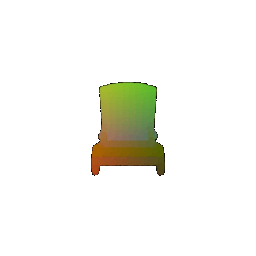|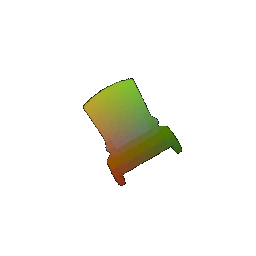|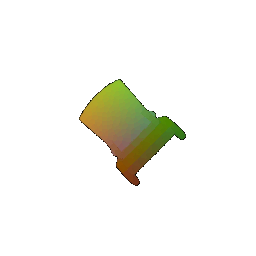|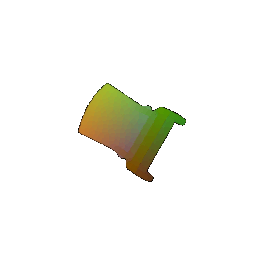|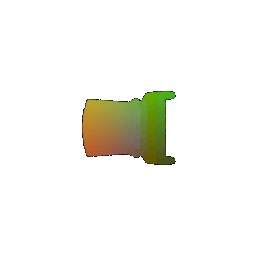|
|Lamp|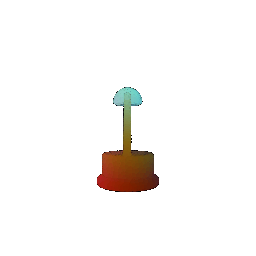|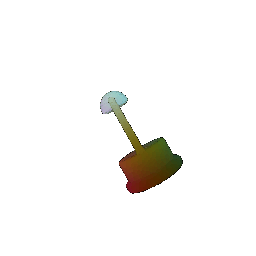|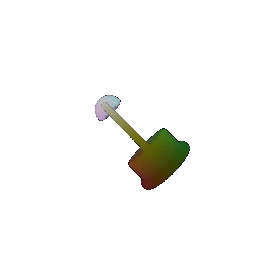|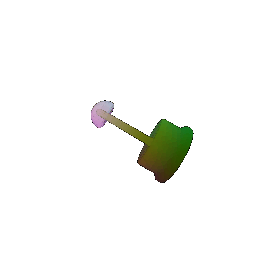|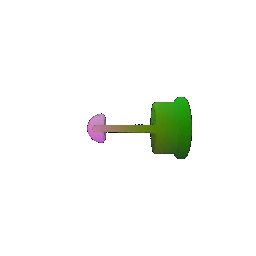|
|Vase|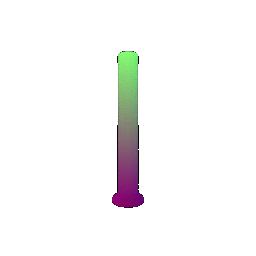|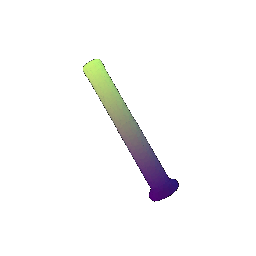|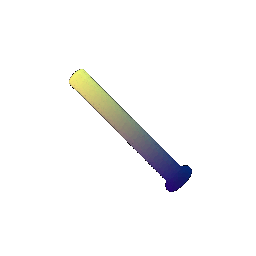|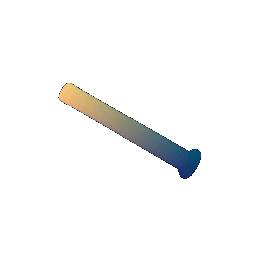|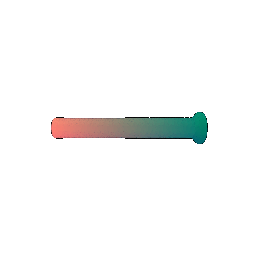|
|Test Accuracy (%)|96.74|84.89|72.19|64.32|47.64|

#### Segmentation

||0 deg|30 deg|45 deg|60 deg|90 deg|
|:-:|:-:|:-:|:-:|:-:|:-:|
||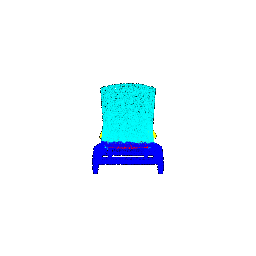|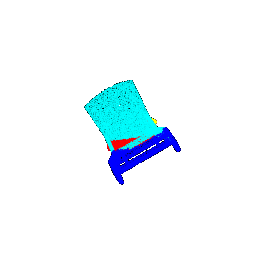|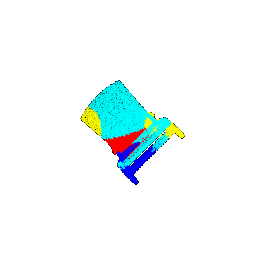|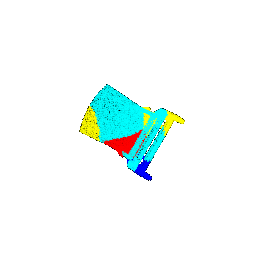|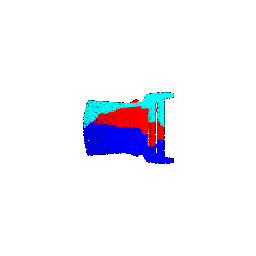|
||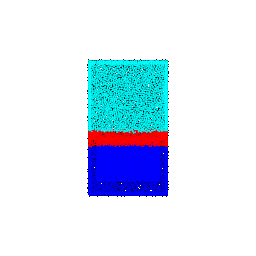|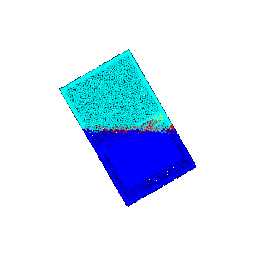|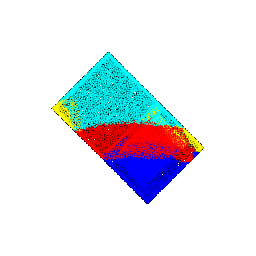|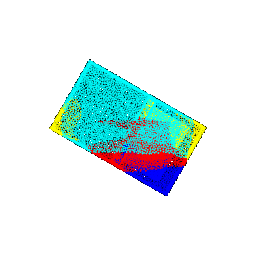|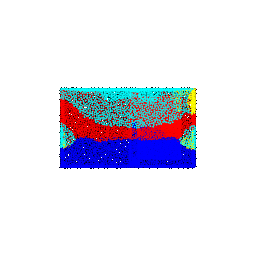|
||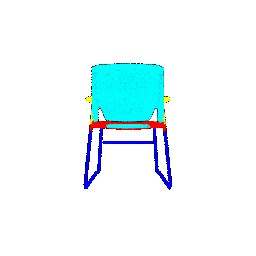|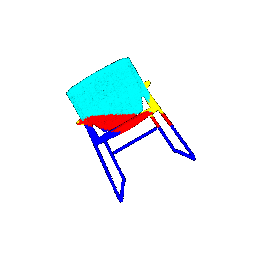|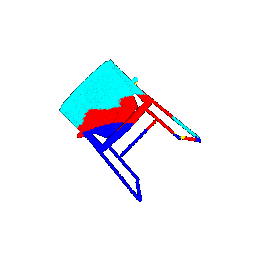|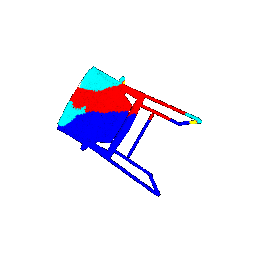|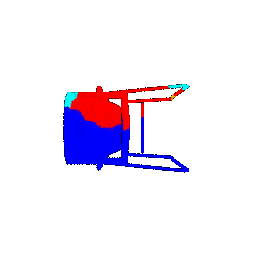|
|Test Accuracy (%)|89.78|65.35|54.65|47.65|35.35|

### Ablation: Number of Points
Varying the number of points in the test data doesn't seem to affect the performance of the segmentation and classification models because neither the global or local information is being lost or changed.

#### Classification

||100|1000|2000|4000|10000|
|:-:|:-:|:-:|:-:|:-:|:-:|
|Chair|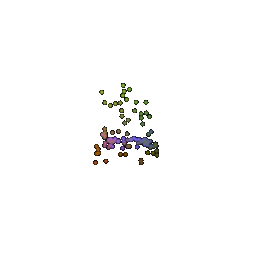|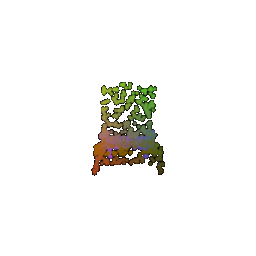|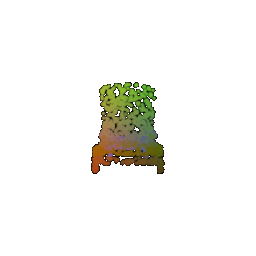|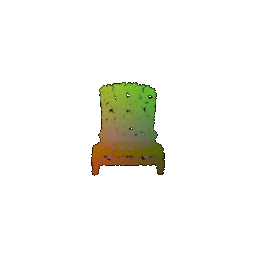|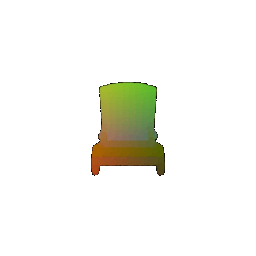|
|Lamp|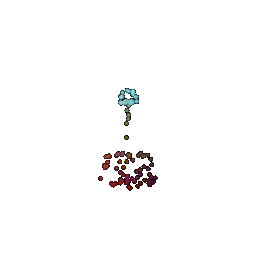|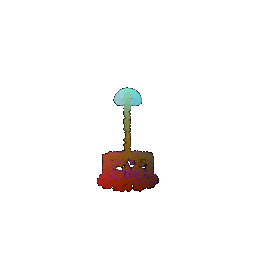|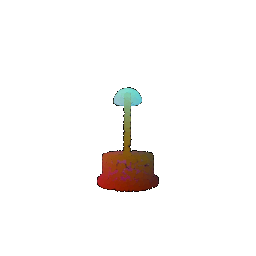|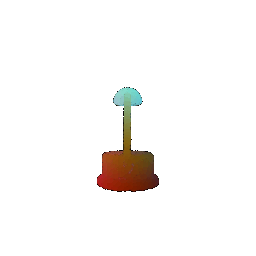|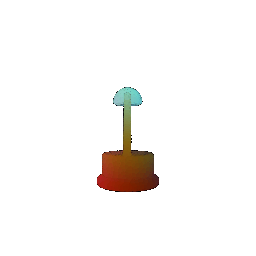|
|Vase|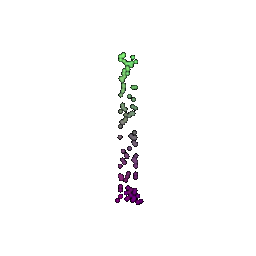|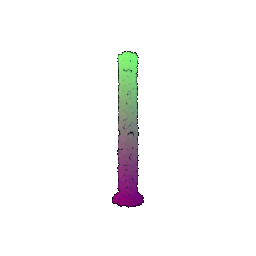|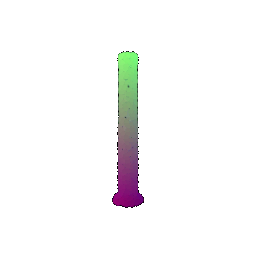|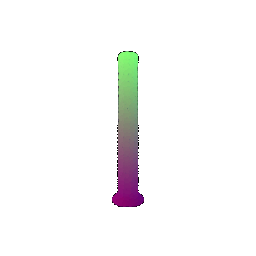|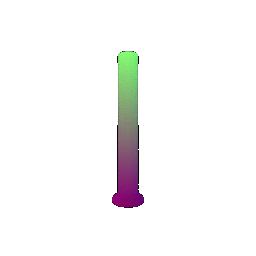|
|Test Accuracy (%)|92.44|96.24|96.53|96.64|96.74|

#### Segmentation

||100|1000|2000|4000|10000|
|:-:|:-:|:-:|:-:|:-:|:-:|
||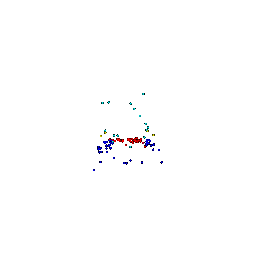|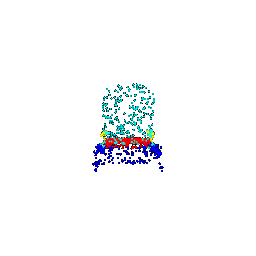|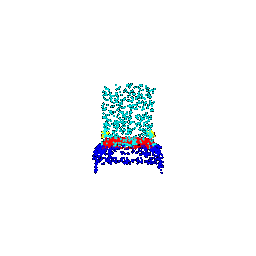|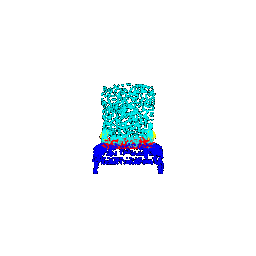|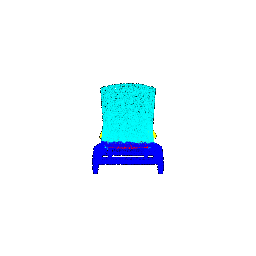|
||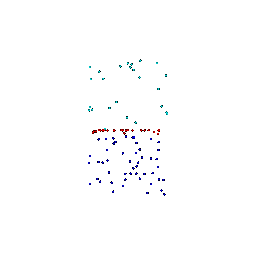|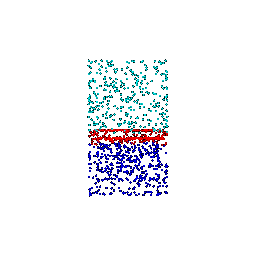|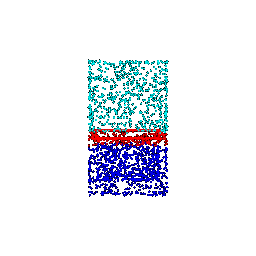|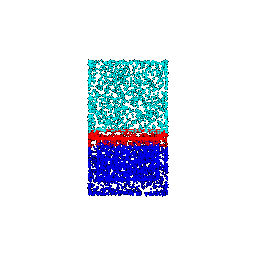|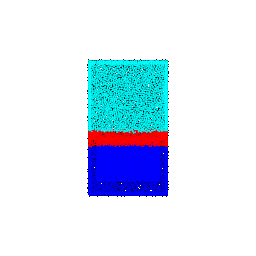|
||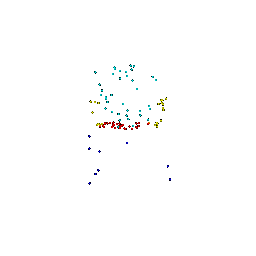|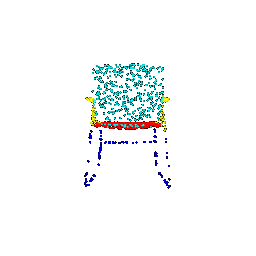|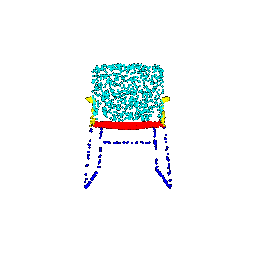|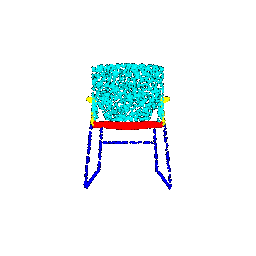|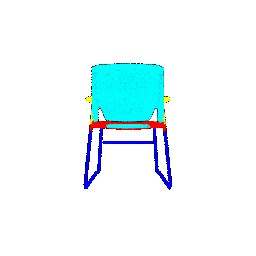|
|Test Accuracy (%)|79.21|88.79|89.54|89.76|89.78|

## Q4. Expressive architectures (10 points + 20 bonus points)

### PointNet++
Best Model Accuracy: 97.59%

PointNet++ is an extension of PointNet. It employs heirarchical feature learning from points. In pointnet, each point was handled independently without any kind of grouping. Heirarchical architecture in PointNet++ involves sampling and grouping layers that improves the local and global feature learning. In the earlier layers, local information is extracted out and global information is effectively learned in the later layers.

To implement this, I first did furthest point sampling which covers the maximum span of the point cloud. This gives the potential centroids within the point cloud. Now using a simple KNN algorithm, I grouped the surrounding k (10) points with the centroid. And I just implemented PointNet on these clusters.

|Ground Truth Class|Predicted Class|Visualization|Interpretation|
|:-:|:-:|:-:|:-:|
|Chair|Chair|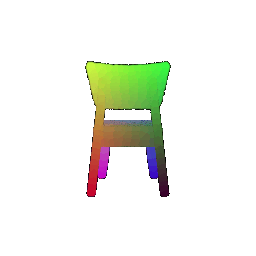|Correctly classified as Chair|
|Vase|Vase|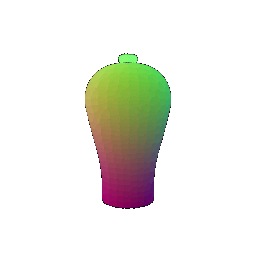|Correctly classified as Vase|
|Lamp|Lamp|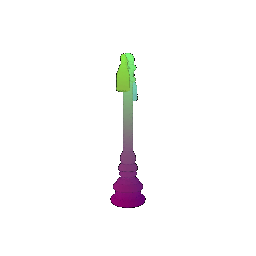|Correctly classified as Lamp|
|Chair|Chair|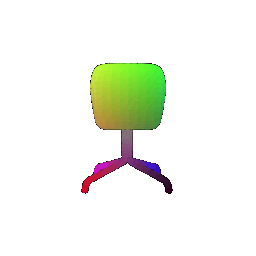|Correctly classified as Chair|
|Chair|Chair|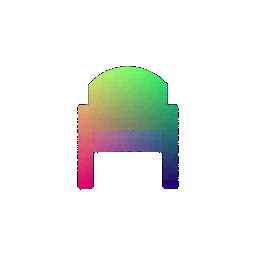|Rectified: Correctly classified as Chair, which was not the case in the vanilla Pointnet|
|Lamp|Vase|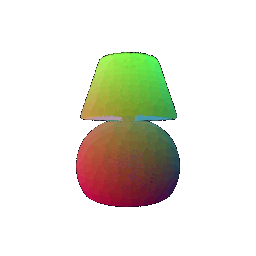|Failure Case: Still not able to classify correctly|
|Vase|Lamp|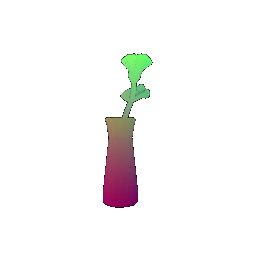|Failure Case: Still not able to classify correctly|

### Point Transformer
Best Model Accuracy: 98.12%

Point Transformer incorporates a self attention mechanism in the point cloud. Each point attends to some k points. These k points are selected by a simple KNN algorithm. Here query is the point itself, and keys and values are from the KNN points. I have taken k to be 10 and point embedding dimension to be 64.

|Ground Truth Class|Predicted Class|Visualization|Interpretation|
|:-:|:-:|:-:|:-:|
|Chair|Chair|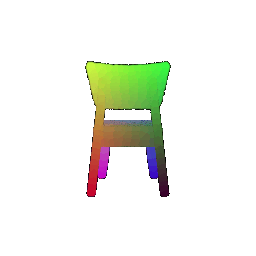|Correctly classified as Chair|
|Vase|Vase|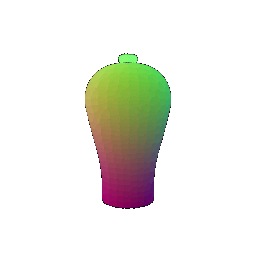|Correctly classified as Vase|
|Lamp|Lamp|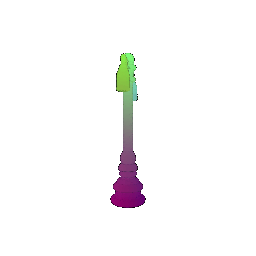|Correctly classified as Lamp|
|Chair|Chair|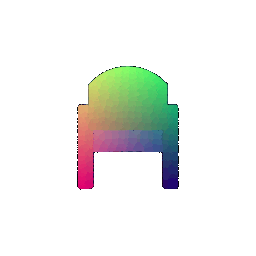|Rectified: Correctly classified as Chair, which was not the case in the vanilla Pointnet|
|Vase|Lamp|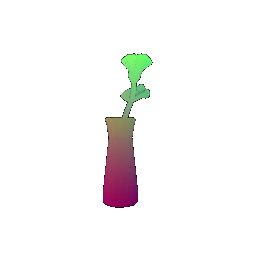|Failure Case: Still not able to classify correctly|
|Chair|Chair|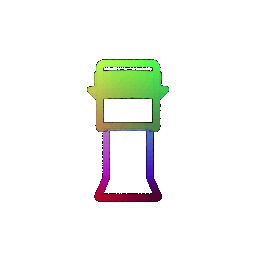|Correctly classified as Chair|